In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt # plot & image processing
from skimage.morphology import label
from skimage.data import imread

import os
import time
import sys

# Configurations
# Split x ratio of train dataset for validation 
TRAINING_VALIDATION_RATIO = 0.2
WORKING_DIR = '/kaggle/working'
INPUT_DIR = '/kaggle/input'
OUTPUT_DIR = '/kaggle/output'
LOGS_DIR = os.path.join(WORKING_DIR, "logs")
TRAIN_DATA_PATH = os.path.join(INPUT_DIR, 'train_v2')
TEST_DATA_PATH = os.path.join(INPUT_DIR, 'test_v2')
SAMPLE_SUBMISSION_PATH = os.path.join(INPUT_DIR, 'sample_submission_v2.csv')
TRAIN_SHIP_SEGMENTATIONS_PATH = os.path.join(INPUT_DIR, 'train_ship_segmentations_v2.csv')
MASK_RCNN_PATH = os.path.join(WORKING_DIR, 'Mask_RCNN-master')
COCO_WEIGHTS_PATH = os.path.join(WORKING_DIR, "mask_rcnn_coco.h5")
SHIP_CLASS_NAME = 'ship'
IMAGE_WIDTH = 768
IMAGE_HEIGHT = 768
SHAPE = (IMAGE_WIDTH, IMAGE_HEIGHT)

test_ds = os.listdir(TEST_DATA_PATH)
train_ds = os.listdir(TRAIN_DATA_PATH)

print('Working Dir:', WORKING_DIR, os.listdir(WORKING_DIR))
print('Input Dir:', INPUT_DIR, os.listdir(INPUT_DIR))
print('train dataset from: {}, {}'.format(TRAIN_DATA_PATH, len(train_ds)))
print('test dataset from: {}, {}'.format(TRAIN_DATA_PATH, len(test_ds)))
print(TRAIN_SHIP_SEGMENTATIONS_PATH)

Working Dir: /kaggle/working ['__notebook_source__.ipynb', '.ipynb_checkpoints']
Input Dir: /kaggle/input ['test_v2', 'train_ship_segmentations_v2.csv', 'train_v2', 'sample_submission_v2.csv']
train dataset from: /kaggle/input/train_v2, 192556
test dataset from: /kaggle/input/train_v2, 15606
/kaggle/input/train_ship_segmentations_v2.csv


# Preparing Dataset
## Run-length mask encording

In [2]:
# Read mask encording from the input CSV file 
masks = pd.read_csv(TRAIN_SHIP_SEGMENTATIONS_PATH)
masks.head()

,ImageId,EncodedPixels
0,00003e153.jpg,NaN
1,0001124c7.jpg,NaN
2,000155de5.jpg,264661 17 265429 33 266197 33 266965 33 267733...
3,000194a2d.jpg,360486 1 361252 4 362019 5 362785 8 363552 10 ...
4,000194a2d.jpg,51834 9 52602 9 53370 9 54138 9 54906 9 55674 ...


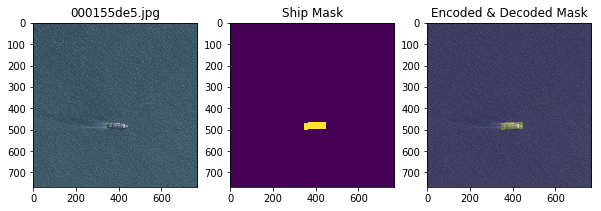

000155de5.jpg  Check Decoding->Encoding RLE_0: 1 -> RLE_1: 1


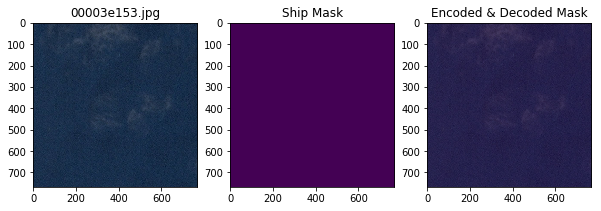

00003e153.jpg  Check Decoding->Encoding RLE_0: 1 -> RLE_1: 0
It could be different when there is no mask.


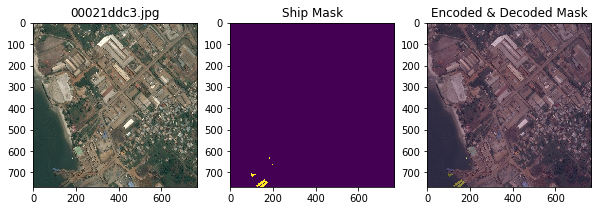

00021ddc3.jpg  Check Decoding->Encoding RLE_0: 9 -> RLE_1: 4
It could be different when there are masks overlapped.


In [3]:
def multi_rle_encode(img):
    labels = label(img[:, :, 0])
    return [rle_encode(labels==k) for k in np.unique(labels[labels>0])]

def rle_encode(img):
    '''
    img: numpy array, 1 - mask, 0 - background
    Returns run length as string formated: [start0] [length0] [start1] [length1]... in 1d array
    '''
    # reshape to 1d array
    pixels = img.T.flatten() # Needed to align to RLE direction
    # pads the head & the tail with 0 & converts to ndarray
    pixels = np.concatenate([[0], pixels, [0]])
    # gets all start(0->1) & end(1->0) positions 
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    # transforms end positions to lengths
    runs[1::2] -= runs[::2]
    # converts to the string formated: '[s0] [l0] [s1] [l1]...'
    return ' '.join(str(x) for x in runs)

def rle_decode(mask_rle, shape=SHAPE):
    '''
    mask_rle: run-length as string formated: [start0] [length0] [start1] [length1]... in 1d array
    shape: (height,width) of array to return 
    Returns numpy array according to the shape, 1 - mask, 0 - background
    '''
    s = mask_rle.split()
    # gets starts & lengths 1d arrays 
    starts, lengths = [np.asarray(x, dtype=int) for x in (s[0::2], s[1::2])]
    starts -= 1
    # gets ends 1d array
    ends = starts + lengths
    # creates blank mask image 1d array
    img = np.zeros(shape[0]*shape[1], dtype=np.uint8)
    # sets mark pixles
    for lo, hi in zip(starts, ends):
        img[lo:hi] = 1
    # reshape as a 2d mask image
    return img.reshape(shape).T  # Needed to align to RLE direction

def masks_as_image(in_mask_list, shape=SHAPE):
    '''Take the individual ship masks and create a single mask array for all ships
    in_mask_list: pd Series: [idx0] [RLE string0]...
    Returns numpy array as (shape.h, sahpe.w, 1)
    '''
    all_masks = np.zeros(shape, dtype = np.int16)
    # if isinstance(in_mask_list, list):
    for mask in in_mask_list:
        if isinstance(mask, str):
            all_masks += rle_decode(mask)
    return np.expand_dims(all_masks, -1)

def shows_decode_encode(image_id, path=TRAIN_DATA_PATH):
    '''Show image, ship mask, and encoded/decoded result
    '''
    fig, axarr = plt.subplots(1, 3, figsize = (10, 5))
    # image
    img_0 = imread(os.path.join(path, image_id))
    axarr[0].imshow(img_0)
    axarr[0].set_title(image_id)
    
    # input mask
    rle_1 = masks.query('ImageId=="{}"'.format(image_id))['EncodedPixels']
    img_1 = masks_as_image(rle_1)
    # takes 2d array (shape.h, sahpe.w)
    axarr[1].imshow(img_1[:, :, 0])
    axarr[1].set_title('Ship Mask')
    
    # encode & decode mask 
    rle_2 = multi_rle_encode(img_1)
    img_2 = masks_as_image(rle_2)
    axarr[2].imshow(img_0)
    axarr[2].imshow(img_2[:, :, 0], alpha=0.3)
    axarr[2].set_title('Encoded & Decoded Mask')
    plt.show()
    print(image_id , ' Check Decoding->Encoding',
          'RLE_0:', len(rle_1), '->',
          'RLE_1:', len(rle_2))

# inspects a few example
shows_decode_encode('000155de5.jpg')
shows_decode_encode('00003e153.jpg')
print('It could be different when there is no mask.')
shows_decode_encode('00021ddc3.jpg')
print('It could be different when there are masks overlapped.')

## Split Test and Validation datasets


unique_img_ids groupby took: 22.02213740348816


,ImageId,ships,RleMaskList
73255,616ebd1e5.jpg,1,[265823 1 266589 4 267355 6 268122 8 268888 10...
94222,7d491c4c3.jpg,1,[551671 5 552439 10 553207 10 553975 10 554743...
176152,ea4360477.jpg,8,[497546 1 498312 4 499079 5 499846 7 500612 10...


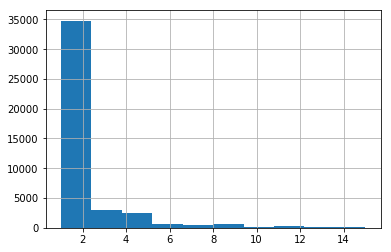

In [4]:
# check if a mask has a ship 
masks['ships'] = masks['EncodedPixels'].map(lambda encoded_pixels: 1 if isinstance(encoded_pixels, str) else 0)
# sum ship# by ImageId and create the unique image id/mask list
start_time = time.time()
unique_img_ids = masks.groupby('ImageId').agg({'ships': 'sum'})
unique_img_ids['RleMaskList'] = masks.groupby('ImageId')['EncodedPixels'].apply(list)
unique_img_ids = unique_img_ids.reset_index()
end_time = time.time() - start_time
print("unique_img_ids groupby took: {}".format(end_time))

# Only care image with ships
unique_img_ids = unique_img_ids[unique_img_ids['ships'] > 0]
unique_img_ids['ships'].hist()
unique_img_ids.sample(3)

34044 training masks
8512 validation masks


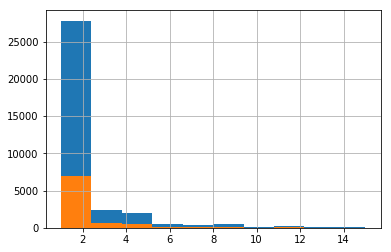

In [5]:
# split to training & validation sets 
from sklearn.model_selection import train_test_split
train_ids, val_ids = train_test_split(unique_img_ids, 
                 test_size = TRAINING_VALIDATION_RATIO, 
                 stratify = unique_img_ids['ships'])
print(train_ids.shape[0], 'training masks')
print(val_ids.shape[0], 'validation masks')
train_ids['ships'].hist()
val_ids['ships'].hist()


In [6]:
# if to clone Mask_R-CNN git when it exists 
UPDATE_MASK_RCNN = False

os.chdir(WORKING_DIR)
if UPDATE_MASK_RCNN:
    !rm -rf {MASK_RCNN_PATH}

# Downlaod Mask RCNN code to a local folder 
if not os.path.exists(MASK_RCNN_PATH):
    ! wget https://github.com/samlin001/Mask_RCNN/archive/master.zip -O Mask_RCNN-master.zip
    ! unzip Mask_RCNN-master.zip 'Mask_RCNN-master/mrcnn/*'
    ! rm Mask_RCNN-master.zip

# Import Mask RCNN
sys.path.append(MASK_RCNN_PATH)  # To find local version of the library
from mrcnn.config import Config
from mrcnn import utils
import mrcnn.model as modellib
from mrcnn import visualize
from mrcnn.model import log    

--2019-06-23 19:39:25--  https://github.com/samlin001/Mask_RCNN/archive/master.zip
Resolving github.com (github.com)... 192.30.253.113
Connecting to github.com (github.com)|192.30.253.113|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://codeload.github.com/samlin001/Mask_RCNN/zip/master [following]
--2019-06-23 19:39:25--  https://codeload.github.com/samlin001/Mask_RCNN/zip/master
Resolving codeload.github.com (codeload.github.com)... 192.30.253.120
Connecting to codeload.github.com (codeload.github.com)|192.30.253.120|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [application/zip]
Saving to: ‘Mask_RCNN-master.zip’

Mask_RCNN-master.zi     [                 <=>]  76.98M  19.6MB/s    in 4.7s    

2019-06-23 19:39:30 (16.5 MB/s) - ‘Mask_RCNN-master.zip’ saved [80718996]

Archive:  Mask_RCNN-master.zip
6af08755687de8bb954d93a6478ea0aee432b263
   creating: Mask_RCNN-master/mrcnn/
 extracting: Mask_RCNN-master/mrc

Using TensorFlow backend.


In [7]:
class AirbusShipDetectionChallengeDataset(utils.Dataset):
    """Airbus Ship Detection Challenge Dataset
    """
    def __init__(self, image_file_dir, ids, masks, image_width=IMAGE_WIDTH, image_height=IMAGE_HEIGHT):
        super().__init__(self)
        self.image_file_dir = image_file_dir
        self.ids = ids
        self.masks = masks
        self.image_width = image_width
        self.image_height = image_height
        
        # Add classes
        self.add_class(SHIP_CLASS_NAME, 1, SHIP_CLASS_NAME)
        self.load_dataset()
        
    def load_dataset(self):
        """Load dataset from the path
        """
        # Add images
        for index, row in self.ids.iterrows():
            image_id = row['ImageId']
            image_path = os.path.join(self.image_file_dir, image_id)
            rle_mask_list = row['RleMaskList']
            #print(rle_mask_list)
            self.add_image(
                SHIP_CLASS_NAME,
                image_id=image_id,
                path=image_path,
                width=self.image_width, height=self.image_height,
                rle_mask_list=rle_mask_list)

    def load_mask(self, image_id):
        """Generate instance masks for shapes of the given image ID.
        """
        info = self.image_info[image_id]
        rle_mask_list = info['rle_mask_list']
        mask_count = len(rle_mask_list)
        mask = np.zeros([info['height'], info['width'], mask_count],
                        dtype=np.uint8)
        i = 0
        for rel in rle_mask_list:
            if isinstance(rel, str):
                np.copyto(mask[:,:,i], rle_decode(rel))
            i += 1
        
        # Return mask, and array of class IDs of each instance. Since we have
        # one class ID only, we return an array of 1s
        return mask.astype(np.bool), np.ones([mask.shape[-1]], dtype=np.int32)
    
    def image_reference(self, image_id):
        """Return the path of the image."""
        info = self.image_info[image_id]
        if info['source'] == SHIP_CLASS_NAME:
            return info['path']
        else:
            super(self.__class__, self).image_reference(image_id)

In [8]:
class AirbusShipDetectionChallengeGPUConfig(Config):
    """
    Configuration of Airbus Ship Detection Challenge Dataset 
    Overrides values in the base Config class.
    """
    NAME = 'ASDC_GPU'
    # NUMBER OF GPUs to use.
    GPU_COUNT = 1
    IMAGES_PER_GPU = 2
    
    NUM_CLASSES = 2  # ship or background
    IMAGE_MIN_DIM = IMAGE_WIDTH
    IMAGE_MAX_DIM = IMAGE_WIDTH
    STEPS_PER_EPOCH = 300
    VALIDATION_STEPS = 50
    SAVE_BEST_ONLY = True
    
    # Minimum probability value to accept a detected instance
    # ROIs below this threshold are skipped
    DETECTION_MIN_CONFIDENCE = 0.95

    # Non-maximum suppression threshold for detection
    # Keep it small to merge overlapping ROIs 
    DETECTION_NMS_THRESHOLD = 0.05

    
config = AirbusShipDetectionChallengeGPUConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     2
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.95
DETECTION_NMS_THRESHOLD        0.05
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 2
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  768
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  768
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [768 768   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE           

## Prepare and load training dataset


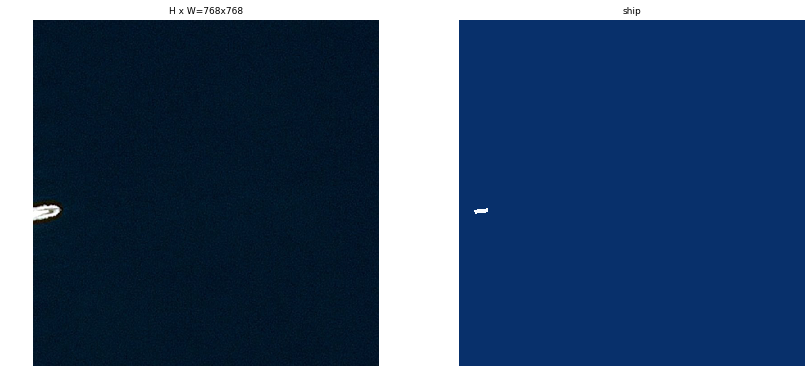

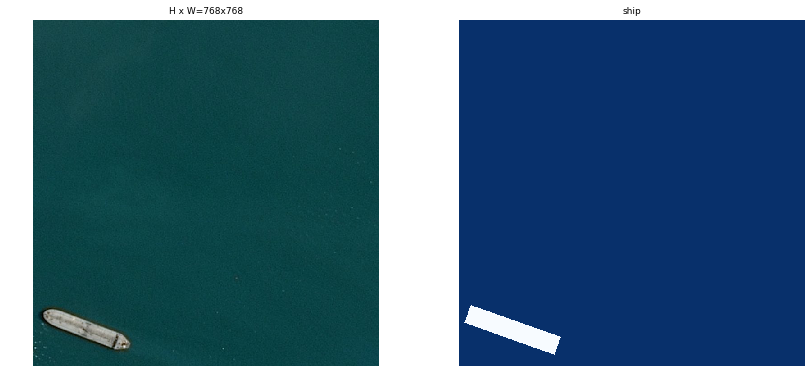

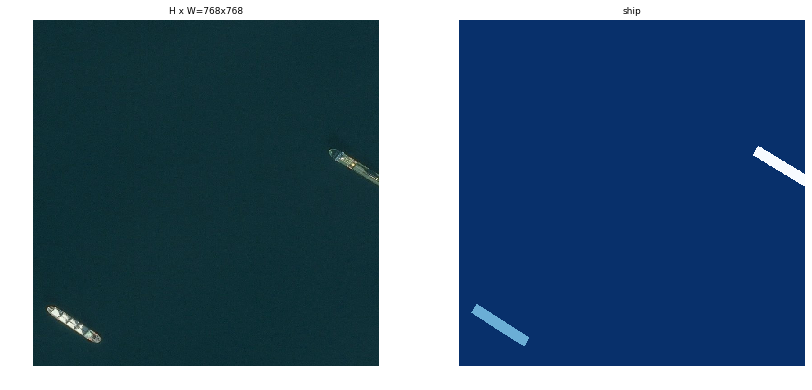

dataset prepare: 7.3536765575408936


In [9]:
start_time = time.time()
# Training dataset.
dataset_train = AirbusShipDetectionChallengeDataset(image_file_dir=TRAIN_DATA_PATH, ids=train_ids, masks=masks)
dataset_train.prepare()

# Validation dataset
dataset_val = AirbusShipDetectionChallengeDataset(image_file_dir=TRAIN_DATA_PATH, ids=val_ids, masks=masks)
dataset_val.prepare()

# Load and display random samples
image_ids = np.random.choice(dataset_train.image_ids, 3)
for image_id in image_ids:
    image = dataset_train.load_image(image_id)
    mask, class_ids = dataset_train.load_mask(image_id)
    visualize.display_top_masks(image, mask, class_ids, dataset_train.class_names, limit=1)

end_time = time.time() - start_time
print("dataset prepare: {}".format(end_time))

## Load pre-trained wieghts
Pre-trained weights for MS COCO is loaded to provide a better straing point for training. 

In [10]:
start_time = time.time()
model = modellib.MaskRCNN(mode="training", config=config, model_dir=WORKING_DIR)

import errno
try:
    weights_path = model.find_last()
    load_weights = True
except FileNotFoundError:
    # if there is no previous trained weights, load COCO
    load_weights = True
    weights_path = COCO_WEIGHTS_PATH
    utils.download_trained_weights(weights_path)
    
if load_weights:
    print("Loading weights: ", weights_path)
    model.load_weights(weights_path, by_name=True, exclude=[
                "mrcnn_class_logits", "mrcnn_bbox_fc",
                "mrcnn_bbox", "mrcnn_mask"])

end_time = time.time() - start_time
print("loading weights: {}".format(end_time))

... done downloading pretrained model!
Loading weights:  /kaggle/working/mask_rcnn_coco.h5
loading weights: 25.06271767616272


# Train the model

In [11]:
"""Train the model."""
start_time = time.time()    
model.train(dataset_train, dataset_val,
            learning_rate=config.LEARNING_RATE * 1.5,
            epochs=2,
            layers='all')
end_time = time.time() - start_time
print("Train model: {}".format(end_time))


Starting at epoch 0. LR=0.0015

Checkpoint Path: /kaggle/working/asdc_gpu20190623T1940/mask_rcnn_asdc_gpu_{epoch:04d}.h5
Selecting layers to train
conv1                  (Conv2D)
bn_conv1               (BatchNorm)
res2a_branch2a         (Conv2D)
bn2a_branch2a          (BatchNorm)
res2a_branch2b         (Conv2D)
bn2a_branch2b          (BatchNorm)
res2a_branch2c         (Conv2D)
res2a_branch1          (Conv2D)
bn2a_branch2c          (BatchNorm)
bn2a_branch1           (BatchNorm)
res2b_branch2a         (Conv2D)
bn2b_branch2a          (BatchNorm)
res2b_branch2b         (Conv2D)
bn2b_branch2b          (BatchNorm)
res2b_branch2c         (Conv2D)
bn2b_branch2c          (BatchNorm)
res2c_branch2a         (Conv2D)
bn2c_branch2a          (BatchNorm)
res2c_branch2b         (Conv2D)
bn2c_branch2b          (BatchNorm)
res2c_branch2c         (Conv2D)
bn2c_branch2c          (BatchNorm)
res3a_branch2a         (Conv2D)
bn3a_branch2a          (BatchNorm)
res3a_branch2b         (Conv2D)
bn3a_branch2b   

/opt/conda/lib/python3.6/site-packages/tensorflow/python/ops/gradients_impl.py:110: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/opt/conda/lib/python3.6/site-packages/keras/engine/training_generator.py:47: UserWarning: Using a generator with `use_multiprocessing=True` and multiple workers may duplicate your data. Please consider using the`keras.utils.Sequence class.
  UserWarning('Using a generator with `use_multiprocessing=True`'


Epoch 1/2
300/300 [==============================] - 328s 1s/step - loss: 1.1862 - rpn_class_loss: 0.0157 - rpn_bbox_loss: 0.4295 - mrcnn_class_loss: 0.0547 - mrcnn_bbox_loss: 0.3668 - mrcnn_mask_loss: 0.3195 - val_loss: 1.1247 - val_rpn_class_loss: 0.0202 - val_rpn_bbox_loss: 0.4608 - val_mrcnn_class_loss: 0.0566 - val_mrcnn_bbox_loss: 0.2818 - val_mrcnn_mask_loss: 0.3052
Epoch 2/2
300/300 [==============================] - 251s 838ms/step - loss: 0.9080 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.3441 - mrcnn_class_loss: 0.0333 - mrcnn_bbox_loss: 0.2391 - mrcnn_mask_loss: 0.2826 - val_loss: 0.8457 - val_rpn_class_loss: 0.0057 - val_rpn_bbox_loss: 0.3180 - val_mrcnn_class_loss: 0.0213 - val_mrcnn_bbox_loss: 0.2326 - val_mrcnn_mask_loss: 0.2681
Train model: 729.2334790229797


# Inference


Loading weights from  /kaggle/working/asdc_gpu20190623T1940/mask_rcnn_asdc_gpu_0002.h5
Re-starting from epoch 2
original_image           shape: (768, 768, 3)         min:    2.00000  max:  255.00000  uint8
image_meta               shape: (14,)                 min:    0.00000  max:  768.00000  int64
gt_class_id              shape: (1,)                  min:    1.00000  max:    1.00000  int32
gt_bbox                  shape: (1, 4)                min:  145.00000  max:  577.00000  int32
gt_mask                  shape: (768, 768, 1)         min:    0.00000  max:    1.00000  bool


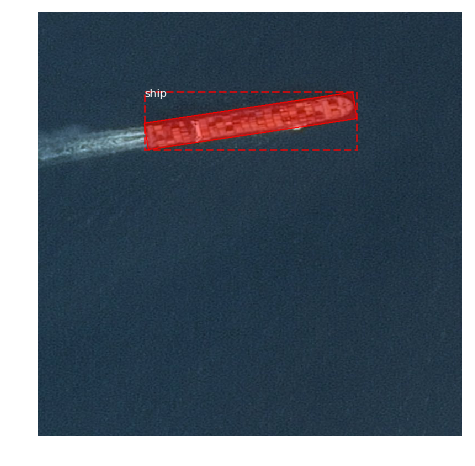

Processing 1 images
image                    shape: (768, 768, 3)         min:    2.00000  max:  255.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -108.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32


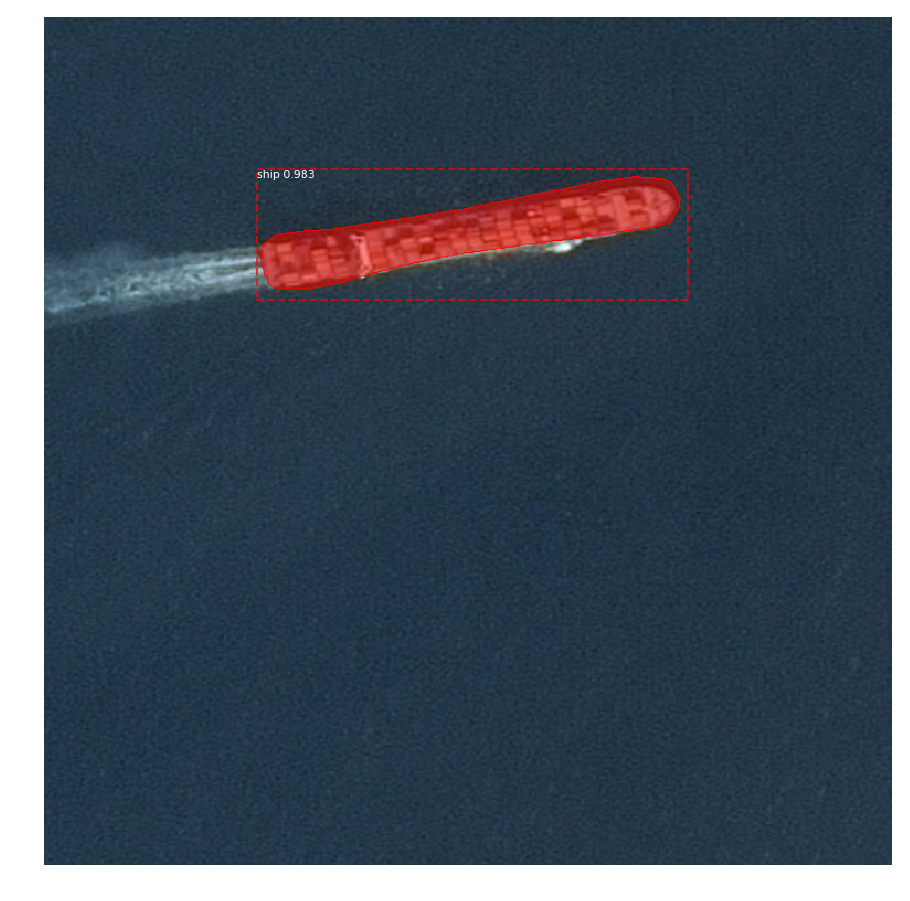

Processing 1 images
image                    shape: (768, 768, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32


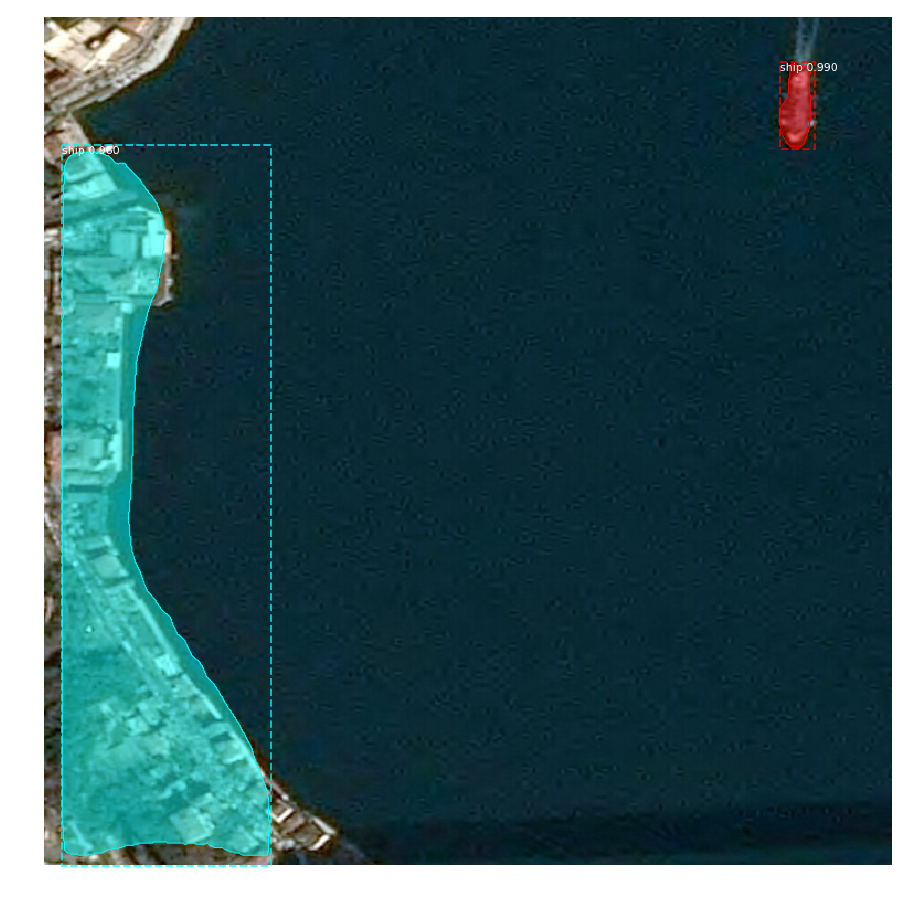

Processing 1 images
image                    shape: (768, 768, 3)         min:    0.00000  max:  124.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -123.70000  max:   20.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32


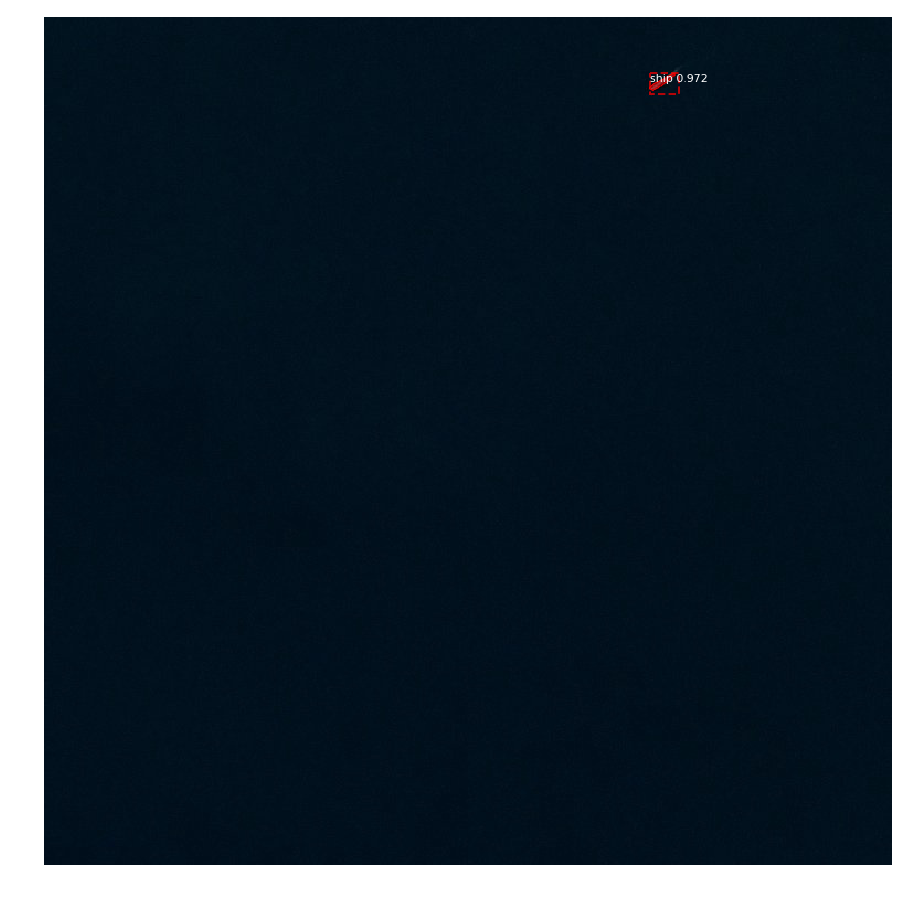

Processing 1 images
image                    shape: (768, 768, 3)         min:    0.00000  max:  239.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -123.70000  max:  135.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32


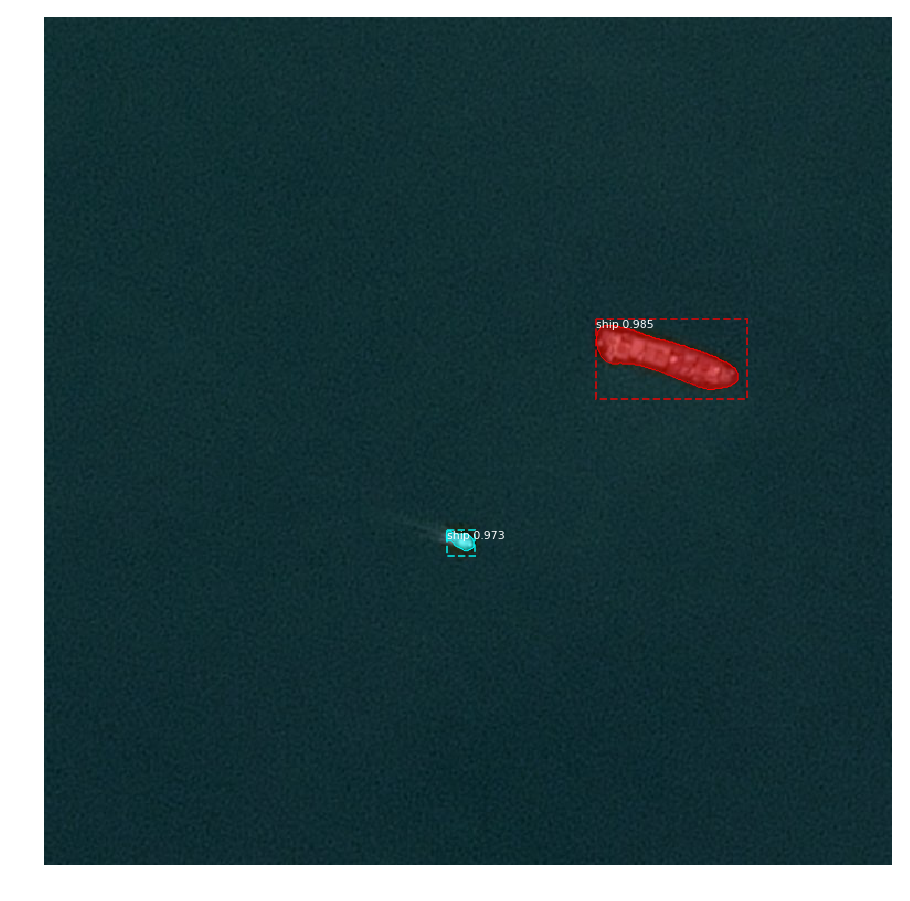

Processing 1 images
image                    shape: (768, 768, 3)         min:   18.00000  max:  186.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -105.70000  max:   71.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32


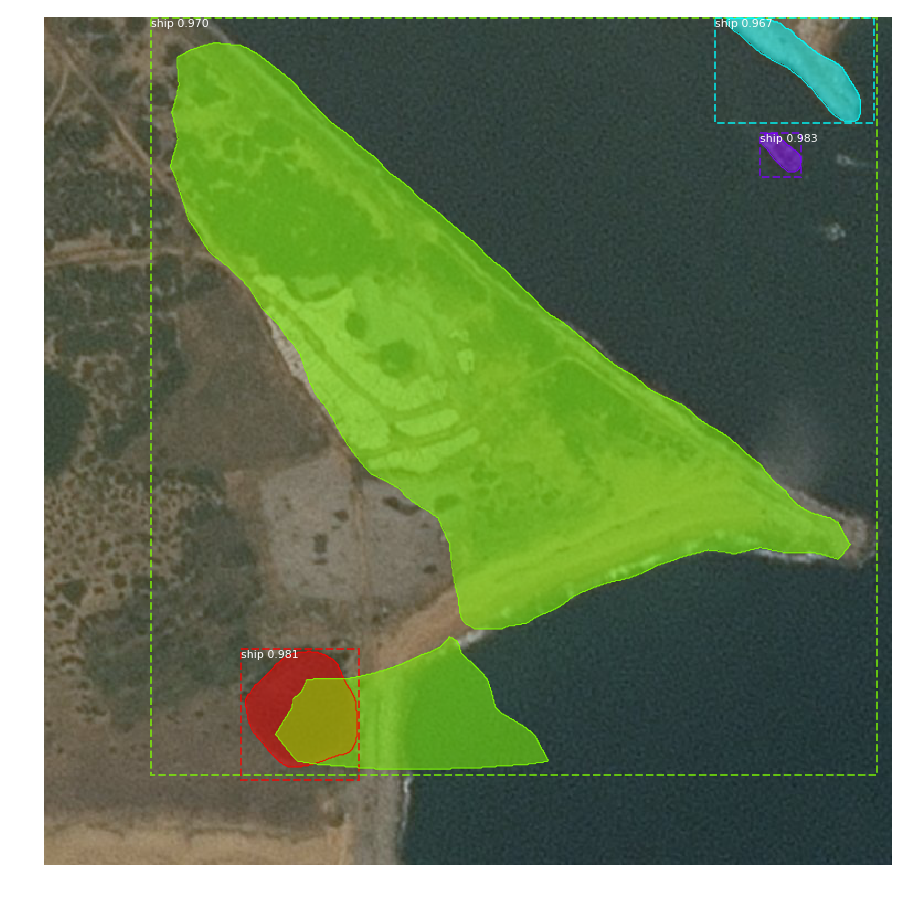

Processing 1 images
image                    shape: (768, 768, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -123.70000  max:  131.30000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32


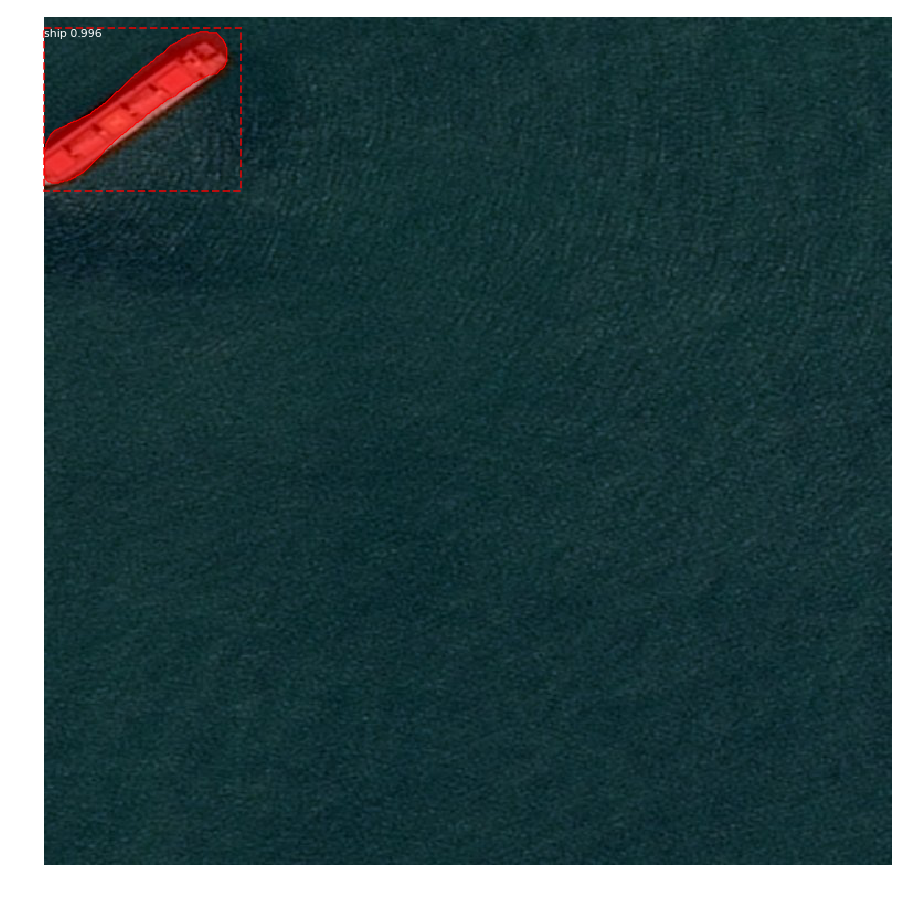

Processing 1 images
image                    shape: (768, 768, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32


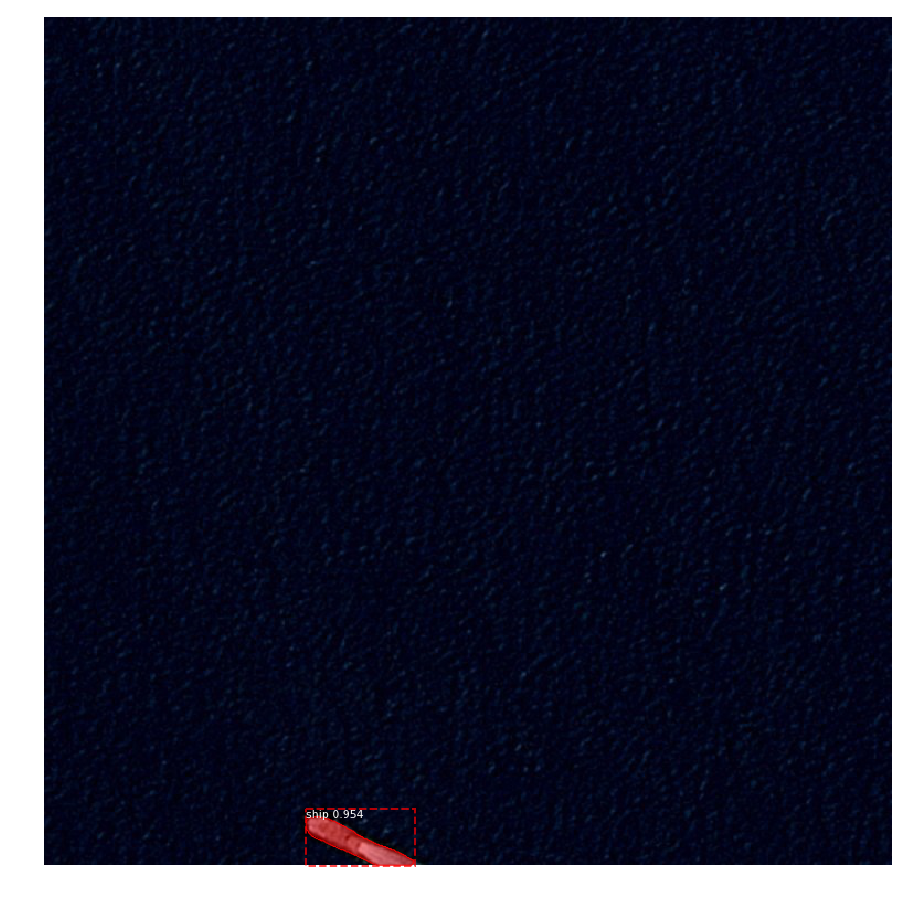

Processing 1 images
image                    shape: (768, 768, 3)         min:    0.00000  max:  233.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -123.70000  max:  121.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32


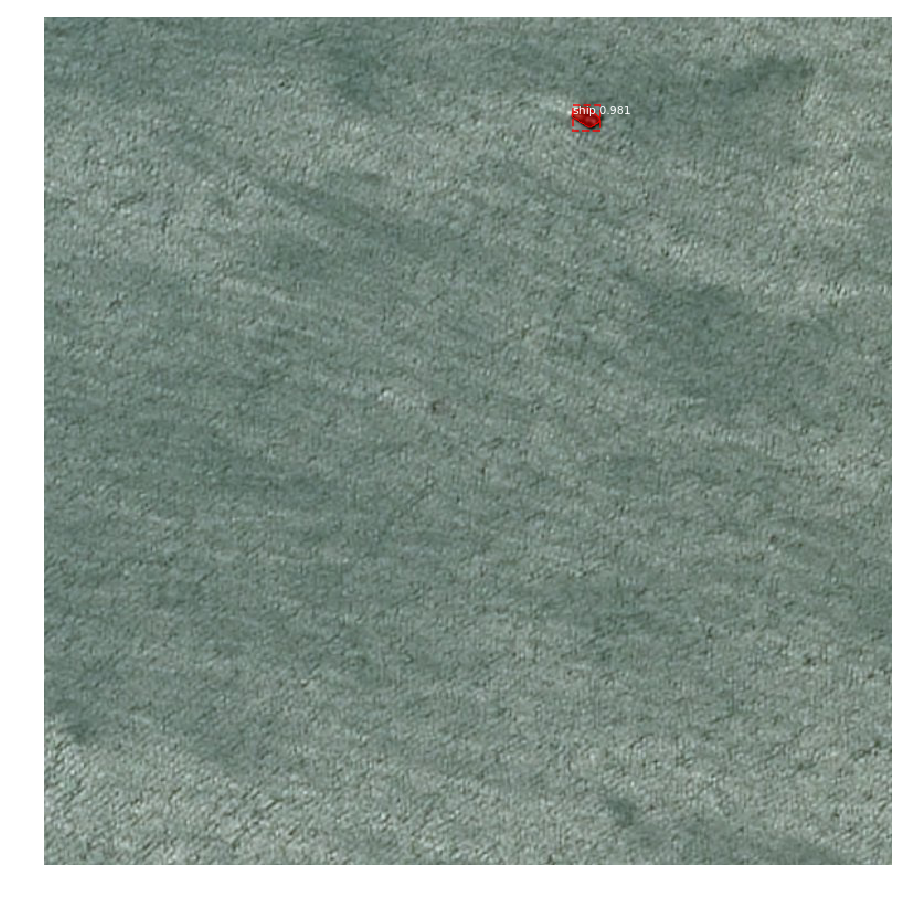

Processing 1 images
image                    shape: (768, 768, 3)         min:   22.00000  max:  184.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min:  -95.70000  max:   80.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32


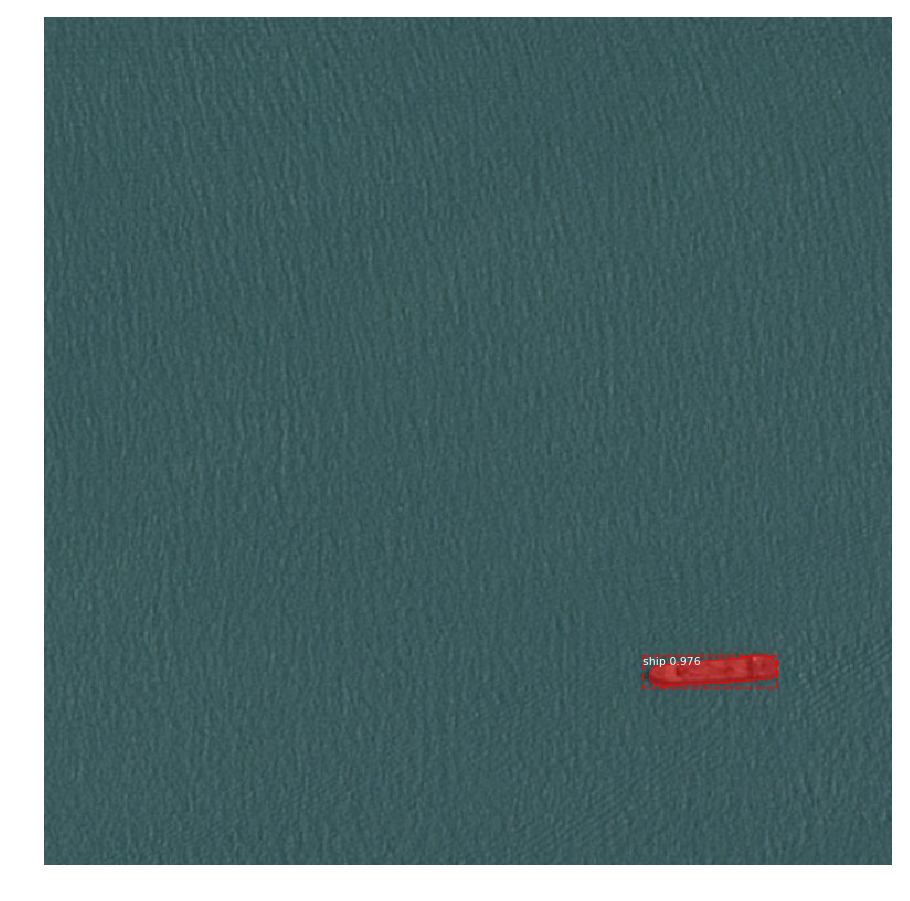

Processing 1 images
image                    shape: (768, 768, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32

*** No instances to display *** 



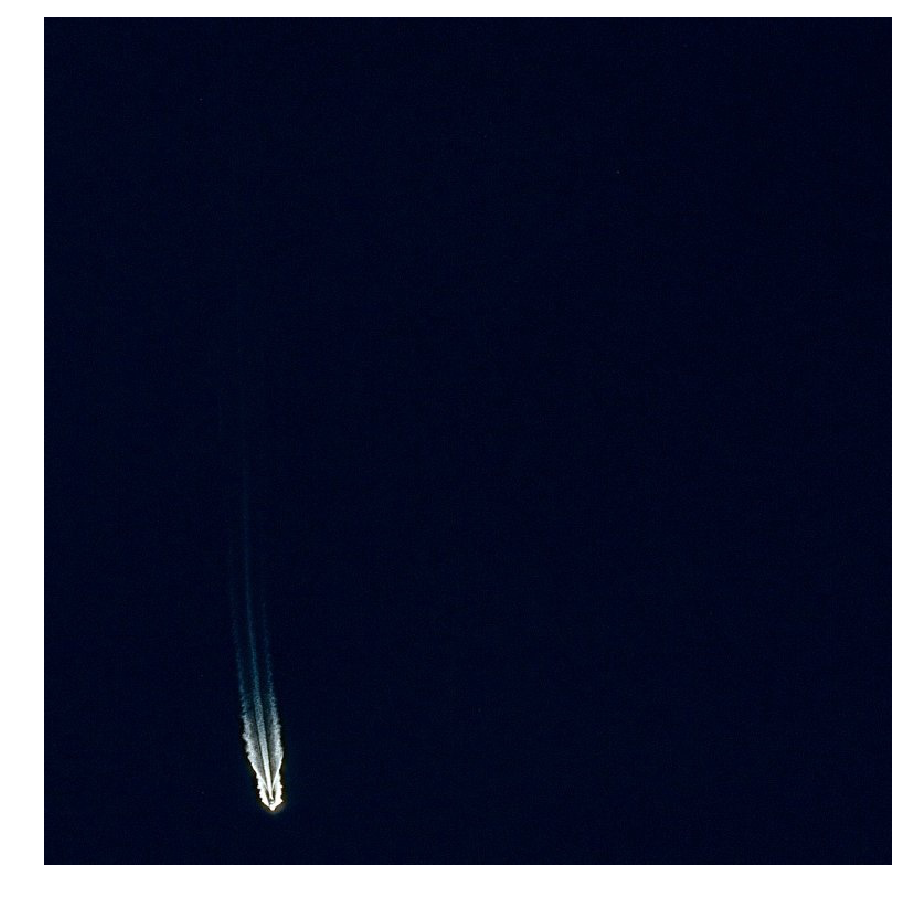

Processing 1 images
image                    shape: (768, 768, 3)         min:    0.00000  max:  222.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -123.70000  max:  118.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32

*** No instances to display *** 



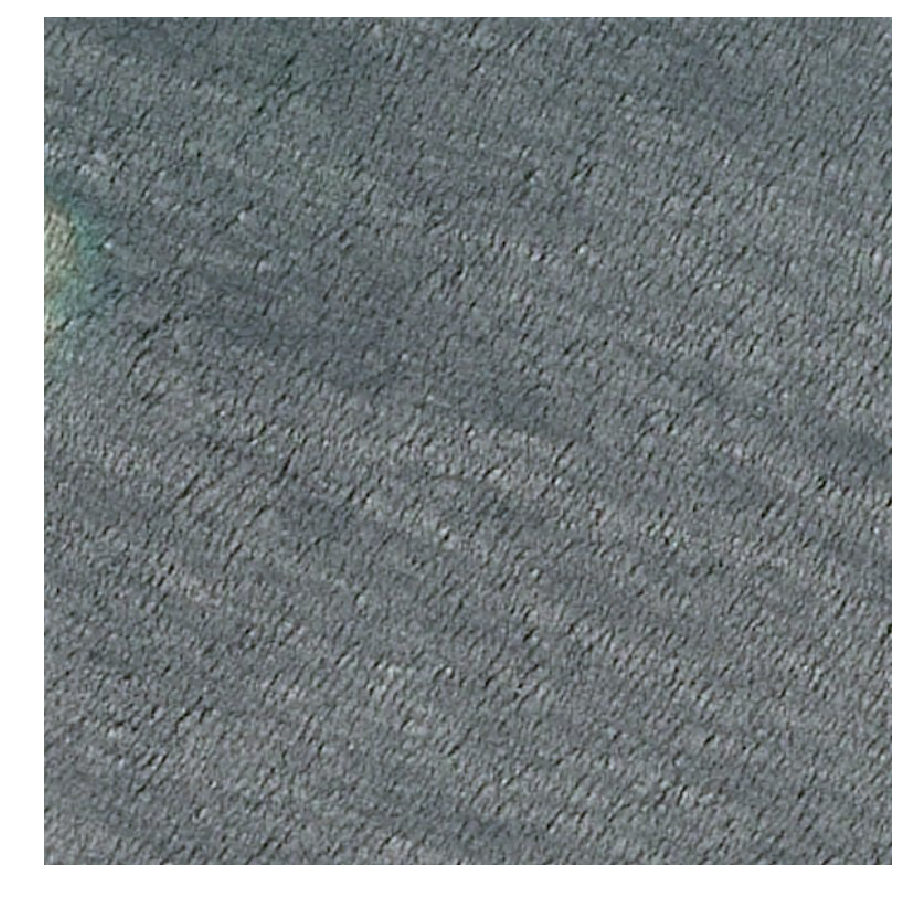

Processing 1 images
image                    shape: (768, 768, 3)         min:   44.00000  max:  222.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min:  -79.70000  max:  112.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32


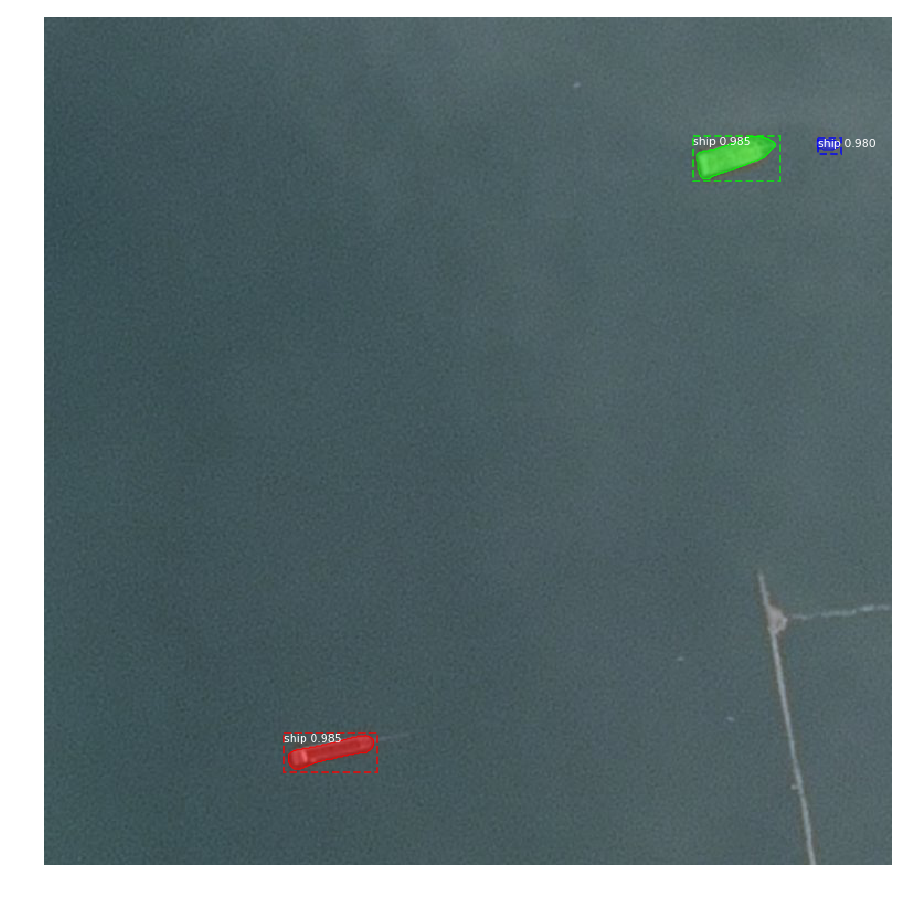

Processing 1 images
image                    shape: (768, 768, 3)         min:   27.00000  max:  244.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min:  -96.70000  max:  124.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32


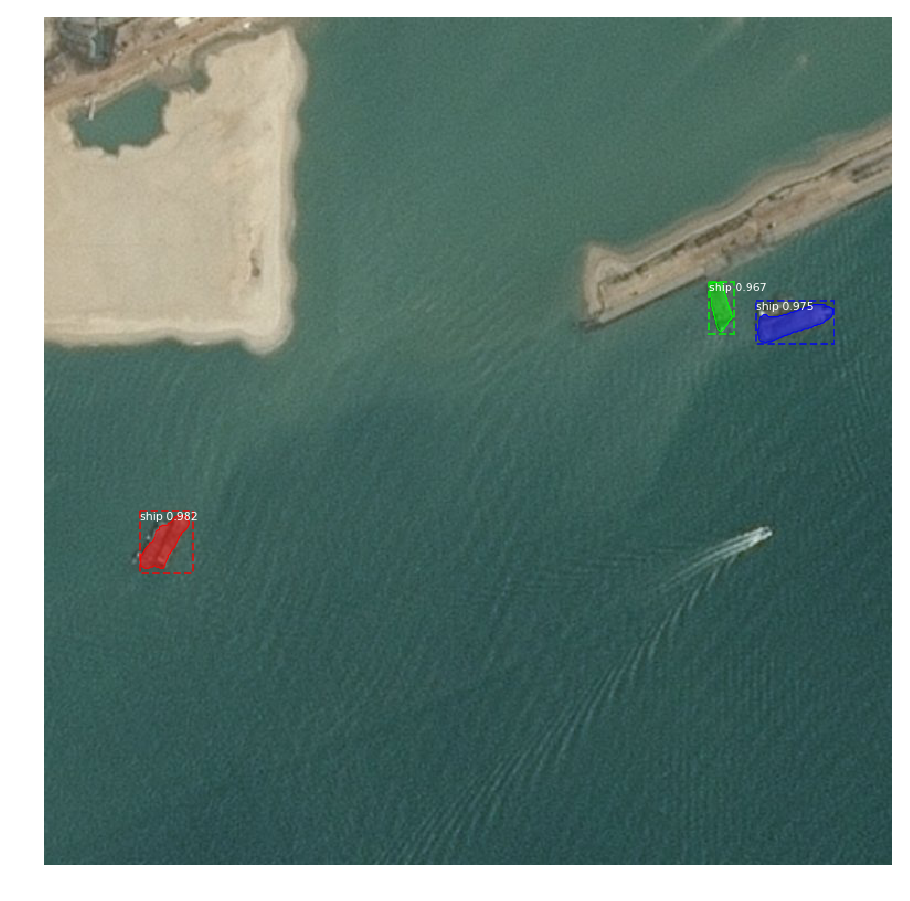

Processing 1 images
image                    shape: (768, 768, 3)         min:   54.00000  max:  146.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min:  -69.70000  max:   42.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32

*** No instances to display *** 



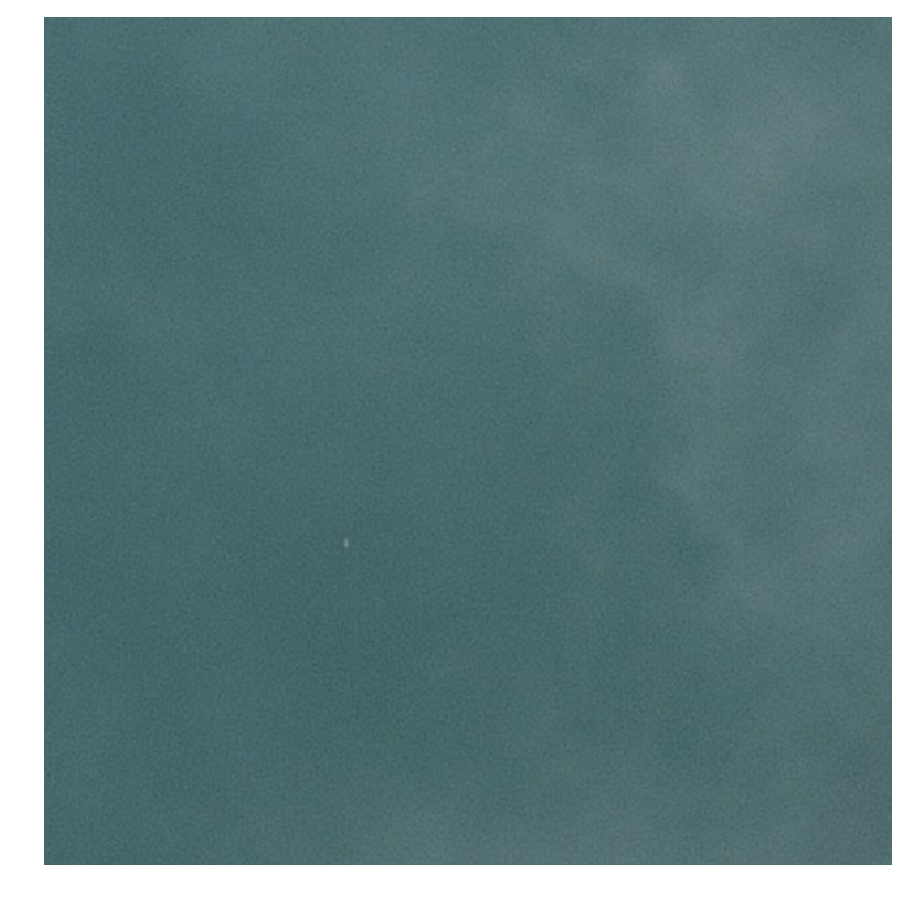

Processing 1 images
image                    shape: (768, 768, 3)         min:    5.00000  max:  246.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -118.70000  max:  142.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32


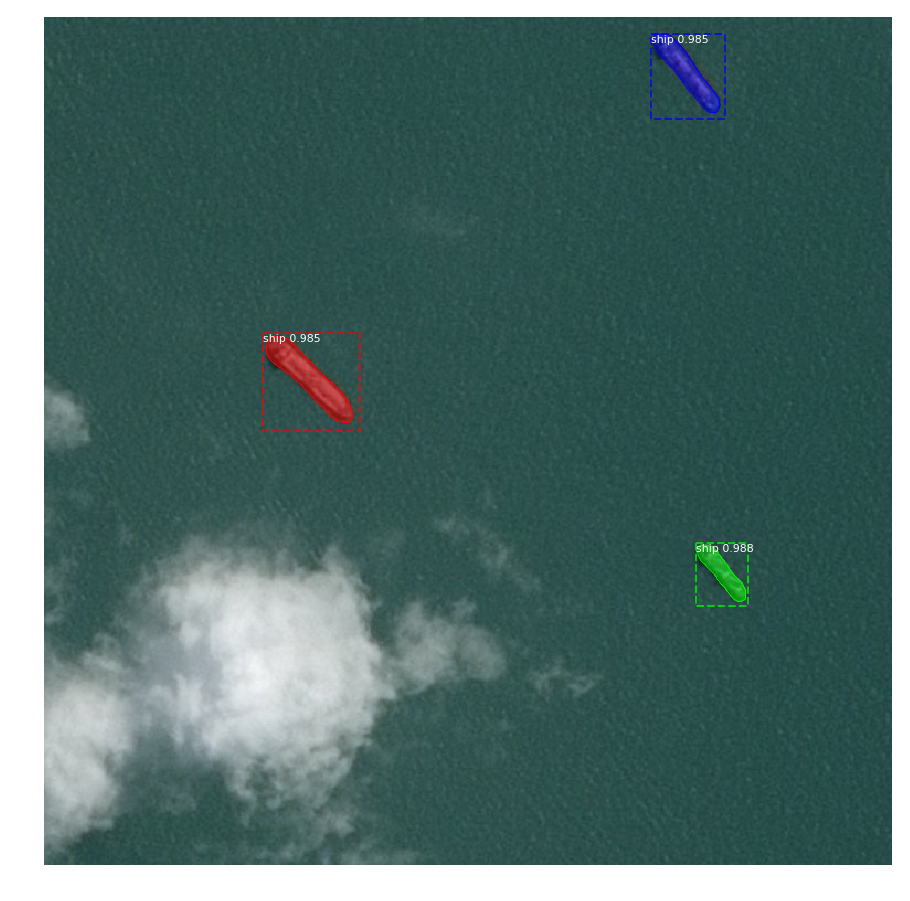

Processing 1 images
image                    shape: (768, 768, 3)         min:    0.00000  max:  202.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -118.70000  max:   80.20000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32


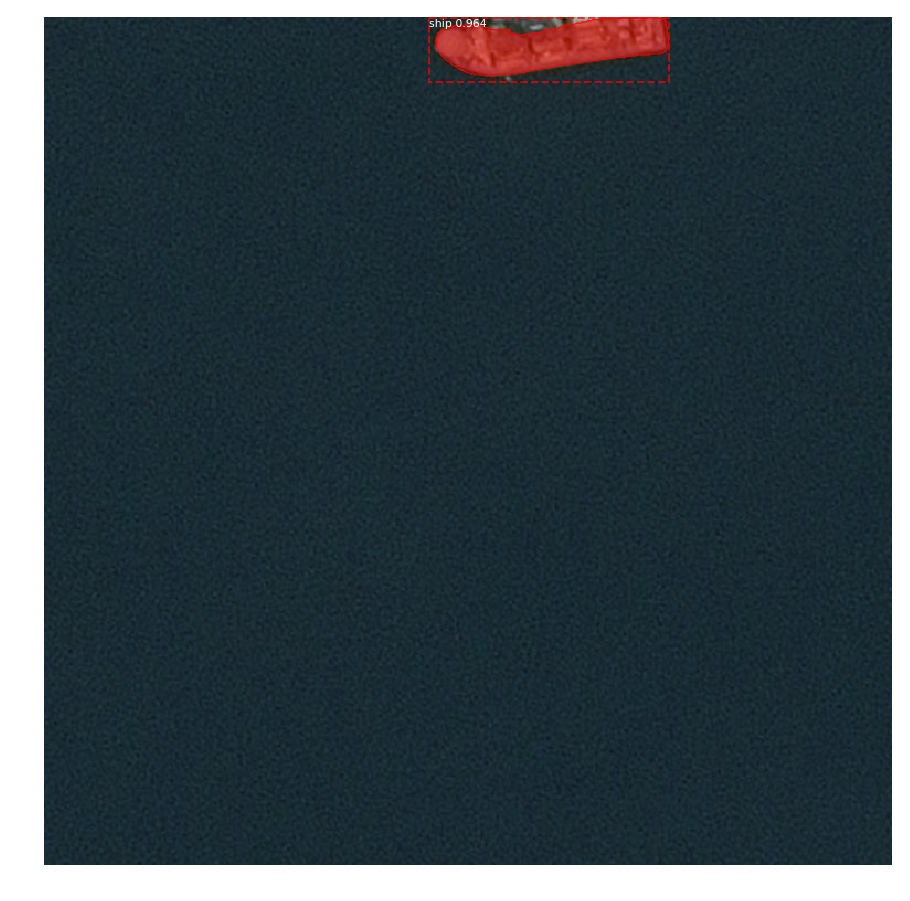

Processing 1 images
image                    shape: (768, 768, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -122.70000  max:  142.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32


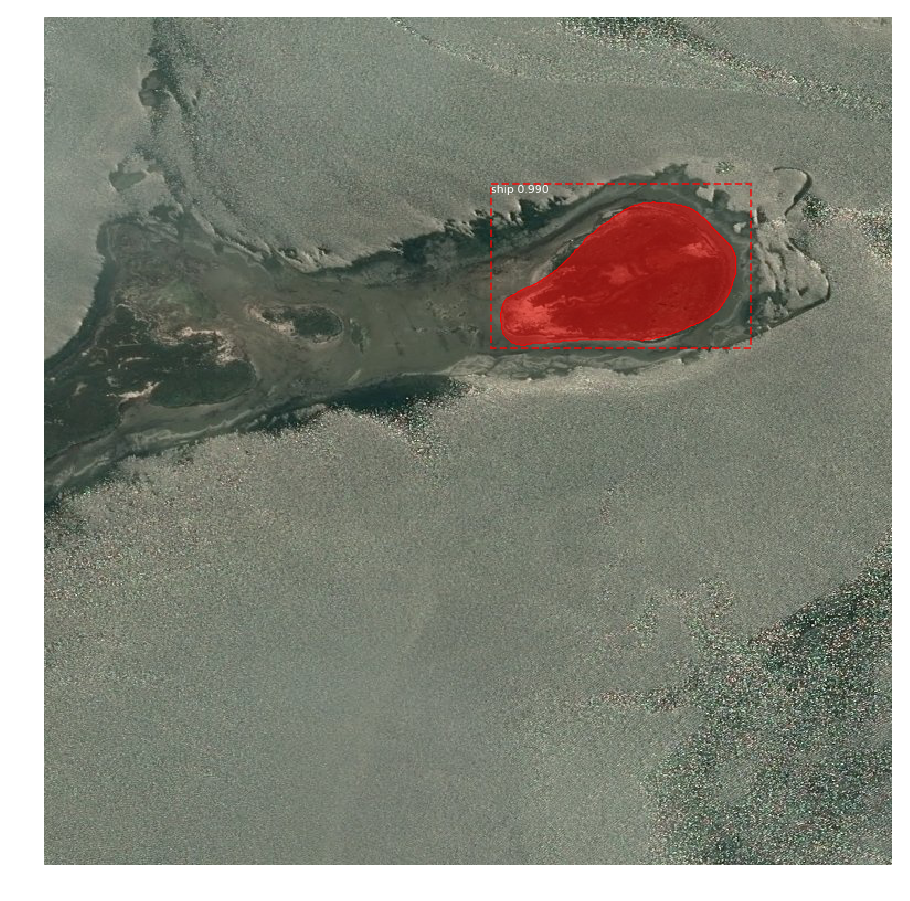

Processing 1 images
image                    shape: (768, 768, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32


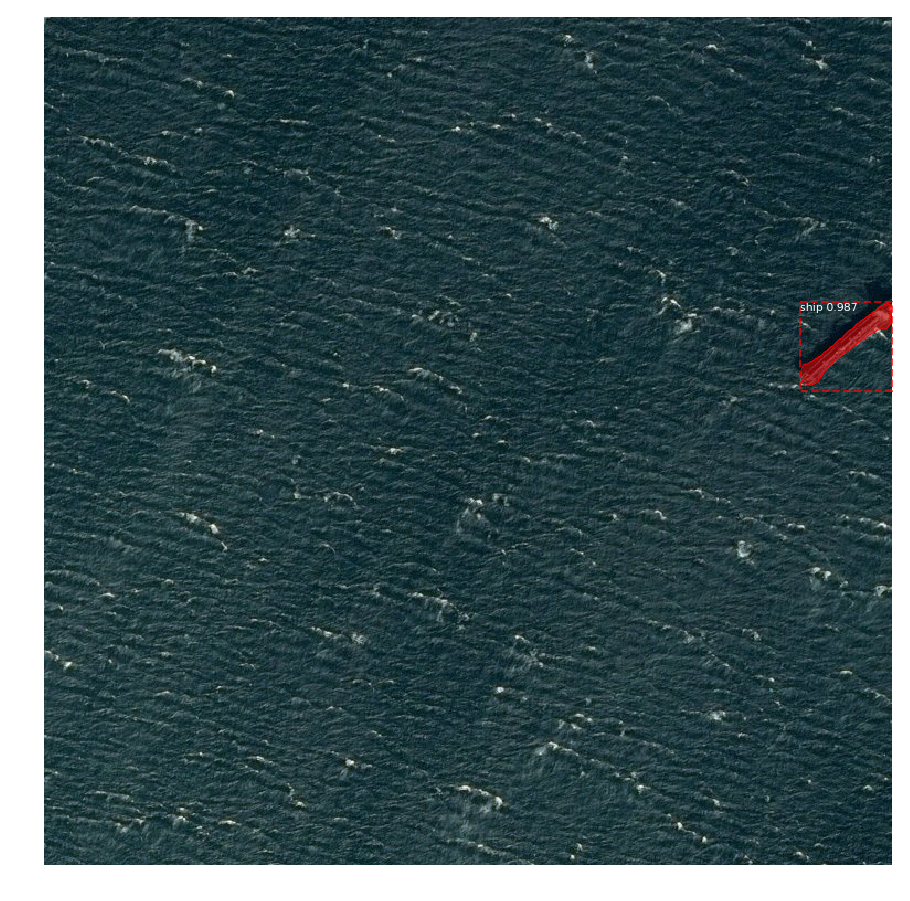

Processing 1 images
image                    shape: (768, 768, 3)         min:    2.00000  max:  255.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -108.70000  max:  146.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32


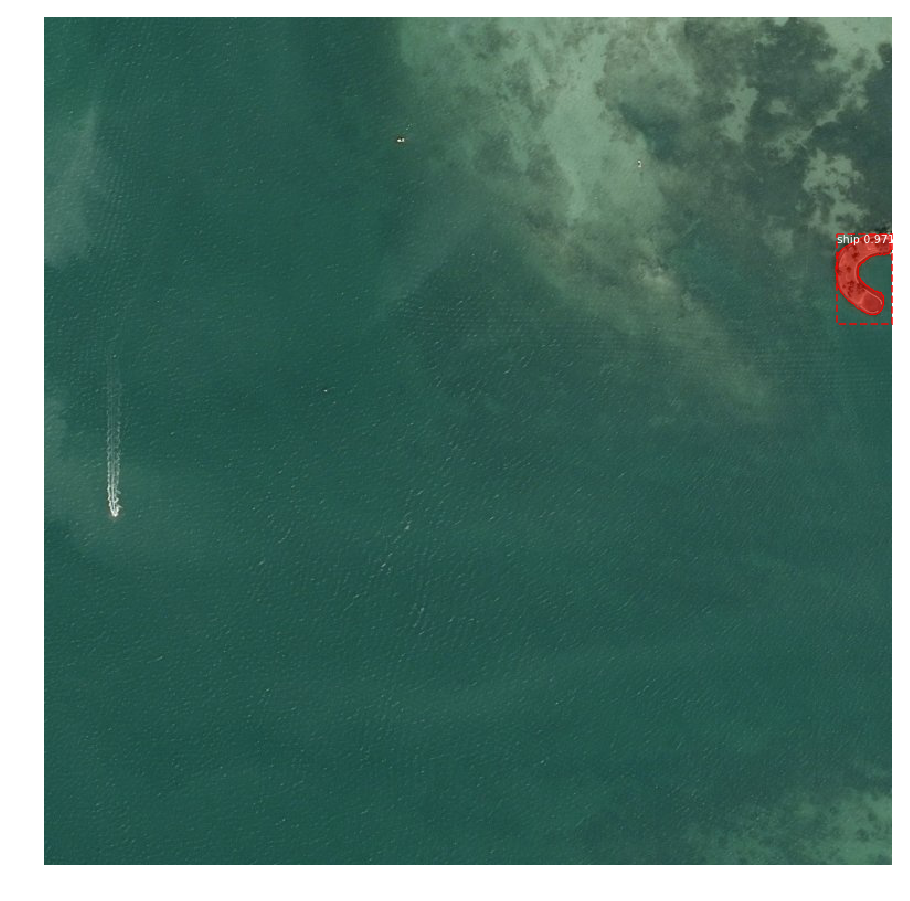

Processing 1 images
image                    shape: (768, 768, 3)         min:   12.00000  max:  206.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -109.70000  max:  101.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32


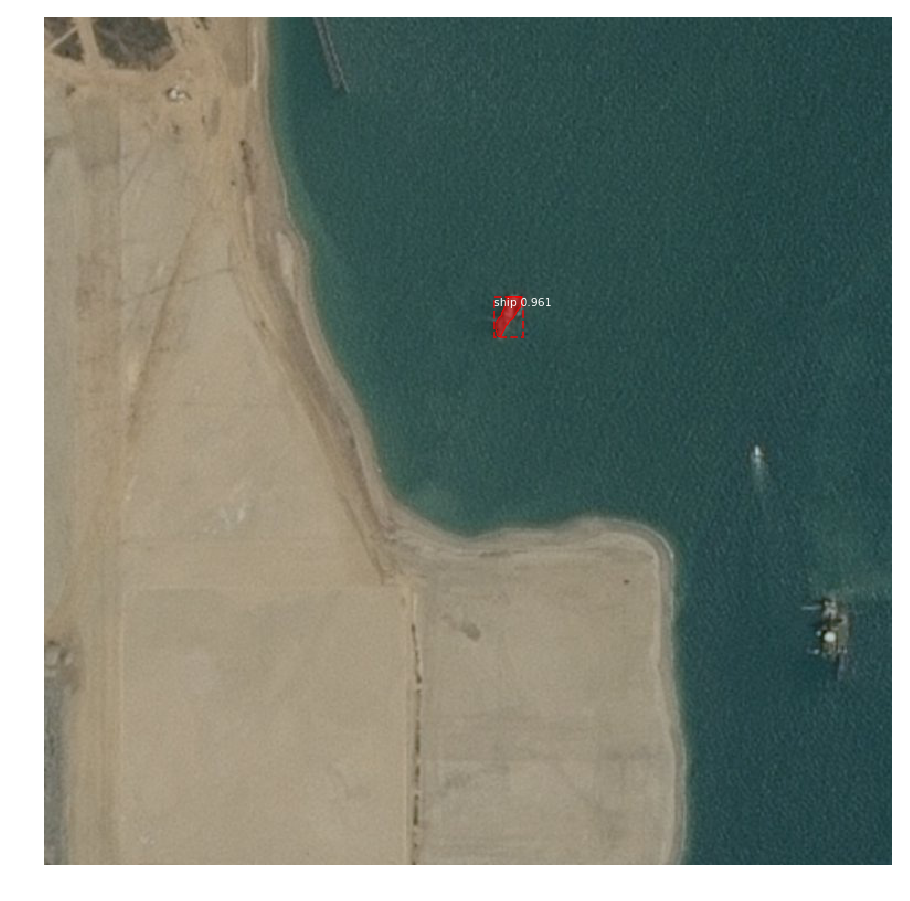

Processing 1 images
image                    shape: (768, 768, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32


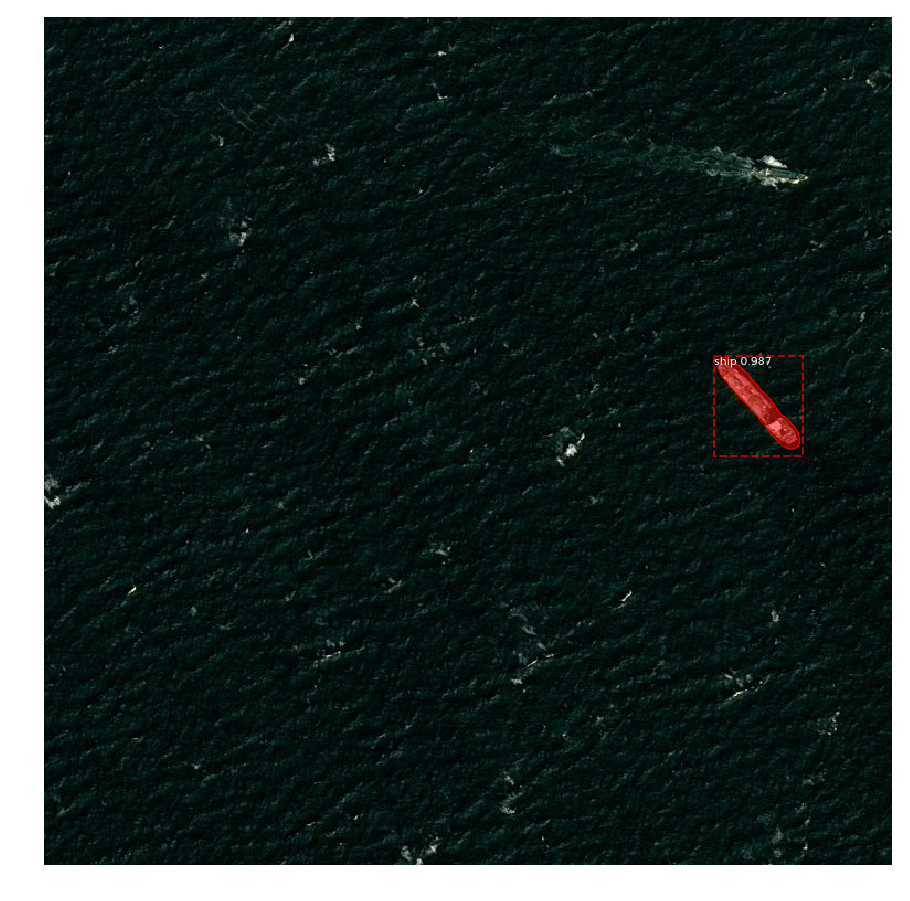

Inference Time: 0.34 Minutes
mAP:  0.4678571432828903


In [12]:
class InferenceConfig(AirbusShipDetectionChallengeGPUConfig):
    GPU_COUNT = 1
    # 1 image for inference 
    IMAGES_PER_GPU = 1

inference_config = InferenceConfig()

# create a model in inference mode
infer_model = modellib.MaskRCNN(mode="inference", 
                          config=inference_config,
                          model_dir=WORKING_DIR)

model_path = infer_model.find_last()

# Load trained weights
print("Loading weights from ", model_path)
infer_model.load_weights(model_path, by_name=True)


# Test on a random image
image_id = np.random.choice(dataset_val.image_ids)
original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset_val, inference_config, 
                           image_id, use_mini_mask=False)

log("original_image", original_image)
log("image_meta", image_meta)
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)

visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                            dataset_train.class_names, figsize=(8, 8))

results = infer_model.detect([original_image], verbose=1)

r = results[0]
visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'], 
                            dataset_val.class_names, r['scores'])

# Compute VOC-Style mean Average Precision @ IoU=0.5
# Running on a few images. Increase for better accuracy.
image_ids = np.random.choice(dataset_val.image_ids, 20)
APs = []
inference_start = time.time()
for image_id in image_ids:
    # Load image and ground truth data
    image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(dataset_val, inference_config,
                               image_id, use_mini_mask=False)
    molded_images = np.expand_dims(modellib.mold_image(image, inference_config), 0)
    # Run object detection
    results = infer_model.detect([image], verbose=1)
    r = results[0]
    visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                            dataset_val.class_names, r['scores'])

    # Compute AP
    AP, precisions, recalls, overlaps =\
        utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                         r["rois"], r["class_ids"], r["scores"], r['masks'])
    APs.append(AP)

inference_end = time.time()
print('Inference Time: %0.2f Minutes'%((inference_end - inference_start)/60))
print("mAP: ", np.mean(APs))
